In [37]:
from pathlib import Path
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision.datasets import CIFAR10, Food101, MNIST
import torchvision.transforms.v2 as transforms
import matplotlib.pyplot as plt
from livelossplot import PlotLosses
from tqdm.notebook import tqdm
import numpy as np
from einops import rearrange, repeat
from einops.layers.torch import Rearrange
from sklearn.metrics import classification_report
from einops._torch_specific import allow_ops_in_compiled_graph
from torch.utils.data import random_split
from torch.amp import GradScaler, autocast
allow_ops_in_compiled_graph()
DATASET_PATH = Path().absolute().resolve() / "datasets"
BATCH_SIZE = 256
device = 'cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu'
torch.set_float32_matmul_precision('high')
%matplotlib inline
%config InlineBackend.figure_format='retina'

## 1 Генеративно-состязательные сети (GAN):
* Реализуйте GAN для генерации изображений определенного класса (например, рукописных цифр из MNIST или объектов из CIFAR-10)
* Обучите модель и продемонстрируйте процесс улучшения качества генерируемых изображений на разных этапах обучения.
* Экспериментируйте с различными архитектурами генератора и дискриминатора.
* Проанализируйте влияние гиперпараметров на стабильность и качество обучения.
* Визуализируйте результаты обучения в виде серии сгенерированных изображений.

#### 1. Подготовка датасета

Для обучения GAN будем использовать датасет CIFAR-10 без каких-либо аугментаций. В качестве предобработки будем использовать только нормализацию.

In [2]:
cifar_transform = transforms.Compose([
    transforms.ToImage(),
    transforms.ToDtype(dtype=torch.float32, scale=True),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])
inv_transform = transforms.Compose([
    transforms.Normalize(mean=(0., 0., 0.), std=(1/0.5, 1/0.5, 1/0.5)),
    transforms.Normalize(mean=(-0.5, -0.5, -0.5), std=(1, 1, 1))
])
train_dataset = CIFAR10(DATASET_PATH, download=True, transform=cifar_transform)

Функция для визуализации батча картинок

In [3]:
def show_batch(imgs, title="", inv_preprocess=None):
    if type(imgs)  is torch.Tensor:
        if inv_preprocess:
            imgs = inv_preprocess(imgs)
        imgs = imgs.permute(0, 2, 3, 1).numpy()
    nrows = int(len(imgs) ** 0.5)
    ncols = round(len(imgs) / nrows)
    fig = plt.figure(figsize=(8, 5))
    idx = 0
    for i in range(nrows):
        for j in range(ncols):
            ax = fig.add_subplot(nrows, ncols, idx + 1)
            if idx < len(imgs):
                plt.imshow((255 * imgs[idx]).astype('uint8'))
                plt.axis('off')
            idx += 1
    plt.suptitle(title, fontsize=30)
    plt.show()

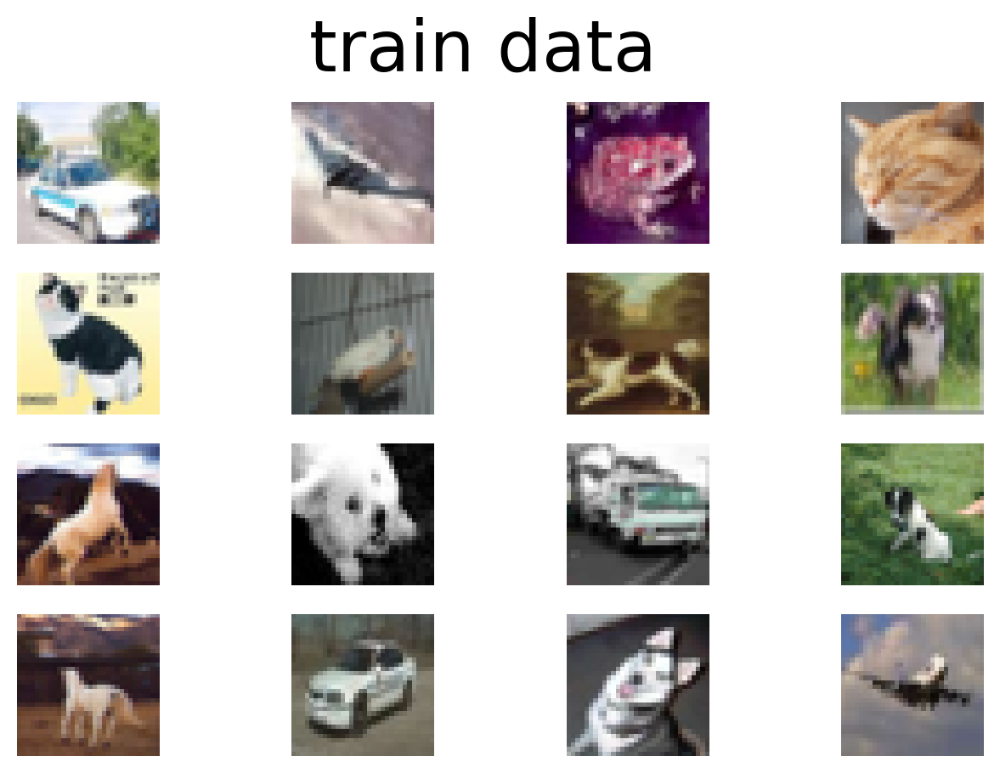

In [4]:
train_loader = DataLoader(train_dataset, BATCH_SIZE, shuffle=True, drop_last=True, num_workers=8, pin_memory=True, prefetch_factor=3)
data, _ = next(iter(train_loader))
show_batch(data[:16], title="train data", inv_preprocess=inv_transform)

#### 2. Подготовка модели

Генератор и дискриминатор будет иметь простую структуру сверточных сетей, состоящую из residual блоков чередуюшихся с upsample/downsample слоями.

Архитектура генератора - k полносвязных не сверточных слоев, затем n-k сверточных слоев. В качестве промежуточных слоев используются Residual блоки, для upsampe - TransposeConvolution. В ходе эксперементов были так же опробованы Upsample слои с различными стратегиями, но они показали более плохой результат.

Архитектура дискриминатора - полностью сверточная сеть из чередующихся Residual блоков и downsample блоков - сверточных слоев, как и с генератором использование более грубых методов вроде пулингов для downsample ухудшает результаты обучения.

Изначально планировалось использовать польностью ResNet backbone для генератора и дискриминатора, но в ходе эксперементов не удалось добится сходимости.

Однако реализация полной ResNet модели понадобится далее для сравнения с ViT.

In [5]:
class ResBlock(nn.Module):
    def __init__(self, in_c, out_c, stride=1, downsample=None, norm_type='batch', *args, **kwargs):
        super().__init__(*args, **kwargs)
        norm = nn.BatchNorm2d if norm_type=='batch' else nn.InstanceNorm2d if norm_type == "instance" else nn.Identity
        self.block_in = nn.Sequential(
            nn.Conv2d(in_c, out_c, kernel_size=3, stride=stride, padding=1, bias=False),
            norm(out_c),
            nn.ReLU(inplace=True),
        )
        self.downsample = downsample if downsample else nn.Identity()
        self.block_out = nn.Sequential(
            nn.Conv2d(out_c, out_c, 3, 1, 1, bias=False),
            norm(out_c),
        )
    
    def forward(self, x):
        identity = x
        identity = self.downsample(identity)
        out = self.block_in(x)
        out = self.block_out(out)
        out = F.relu(identity + out)
        return out

class ResNet(nn.Module):
    def __init__(self, block, layers, num_classes=1, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.in_c = 64
        self.conv_in = nn.Sequential(
            nn.Conv2d(3, 64, 7, 2, 3, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(3, 2, 1)
        )
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)
        self.avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512, num_classes)
    
    def _make_layer(self, block, out_c, blocks, stride=1):
        downsample=None
        if stride != 1 or self.in_c != out_c:
            downsample = nn.Sequential(
                nn.Conv2d(self.in_c, out_c, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_c),
            )
        layers = []
        layers.append(block(self.in_c, out_c, stride, downsample))
        self.in_c = out_c
        for _ in range(1, blocks):
            layers.append(block(out_c, out_c))
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv_in(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.avg_pool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        return x

Так же в гане используется не стандартный adversarial/wgan loss, а relativistic loss + два вида регулярезации. В [статье](https://arxiv.org/pdf/2501.05441), была доказана гарантия локальной сходимости такой комбинации лосов.

In [ ]:
def regulaizer(logits, imgs):
    grads = torch.autograd.grad(
        outputs=logits.sum(),
        inputs=imgs,
        retain_graph=True,
        create_graph=True
    )[0]
    return grads.square().sum([1, 2, 3])

class R3GaNLoss(nn.Module):
    def __init__(self, lmbda):
        super().__init__()
        self.lmbda = lmbda

    def generator_loss(self, discriminator, generator, real_imgs, noise):
        fake_imgs = generator(noise)
        real_imgs = real_imgs.detach()

        fake_logits = discriminator(fake_imgs)
        real_logits = discriminator(real_imgs)

        relativistic_logits = fake_logits - real_logits
        loss = F.softplus(-relativistic_logits)
        return loss.mean()
    
    def discriminator_loss(self, discriminator, generator, real_imgs, noise):
        fake_imgs = generator(noise).detach().requires_grad_(True)
        real_imgs = real_imgs.detach().requires_grad_(True)
        fake_logits = discriminator(fake_imgs)
        real_logits = discriminator(real_imgs)

        r1_prenalty = regulaizer(real_logits, real_imgs)
        r2_prenalty = regulaizer(fake_logits, fake_imgs)

        relativistic_logits = real_logits - fake_logits
        loss = F.softplus(-relativistic_logits)
        loss = loss + (self.lmbda / 2) * (r1_prenalty + r2_prenalty)
        return loss.mean()

In [7]:
def model_parameters(generator, discriminator):
    dp = sum([p.numel() for p in discriminator.parameters()]) / 1e6
    gp = sum([p.numel() for p in generator.parameters()]) / 1e6
    print(f"All model params: {dp+gp}M, Discriminator params: {dp}M, Generator params: {gp}M")

In [ ]:
class Reshape(nn.Module):
    def __init__(self, *shape):
        super().__init__()
        self.shape = shape

    def forward(self, x):
        return x.view(*self.shape)
    
class Generator(nn.Module):
    def __init__(self, z_dim: int = 100, base_channels: int = 64):
        super().__init__()
        self.z_dim = z_dim

        self.pre_conv = nn.Sequential(
            nn.Linear(z_dim, base_channels * 8 * 4 * 4, bias=False),
            nn.BatchNorm1d(base_channels * 8 * 4 * 4),
            nn.ReLU(inplace=True),
            Reshape(-1, base_channels * 8, 4, 4)
            )

        self.conv = nn.Sequential(
            ResBlock(base_channels * 8, base_channels * 8, norm_type='instance'),

            nn.ConvTranspose2d(base_channels*8, base_channels*4, kernel_size=5, stride=2, 
                                padding=2, output_padding=1, bias=False),
            nn.InstanceNorm2d(base_channels*4),
            nn.ReLU(inplace=True),

            ResBlock(base_channels * 4, base_channels * 4, norm_type='instance'),
            ResBlock(base_channels * 4, base_channels * 4, norm_type='instance'),

            nn.ConvTranspose2d(base_channels*4, base_channels*2, kernel_size=5, stride=2, 
                                padding=2, output_padding=1, bias=False),
            nn.InstanceNorm2d(base_channels*2),
            nn.ReLU(inplace=True),

            ResBlock(base_channels * 2, base_channels * 2, norm_type='instance'),
            ResBlock(base_channels * 2, base_channels * 2, norm_type='instance'),

            nn.ConvTranspose2d(base_channels*2, base_channels, kernel_size=5, stride=2, 
                                padding=2, output_padding=1, bias=False),
            nn.InstanceNorm2d(base_channels),
            nn.ReLU(inplace=True),
            ResBlock(base_channels, base_channels, norm_type='instance'),
            ResBlock(base_channels, base_channels, norm_type='instance'),
            nn.Conv2d(base_channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        x = self.pre_conv(z)
        x = self.conv(x)
        return x


class Discriminator(nn.Module):
    def __init__(self, in_channels: int = 3, base_channels: int = 64):
        super().__init__()

        self.main = nn.Sequential(
            nn.Conv2d(in_channels, base_channels, kernel_size=5, stride=2, padding=2),
            nn.LeakyReLU(0.2, inplace=True),

            ResBlock(base_channels, base_channels, norm_type='instance'),
            ResBlock(base_channels, base_channels, norm_type='instance'),

            nn.Conv2d(base_channels, base_channels*2, kernel_size=5, stride=2, padding=2),
            nn.InstanceNorm2d(base_channels*2),
            nn.LeakyReLU(0.2, inplace=True),

            ResBlock(base_channels * 2, base_channels * 2, norm_type='instance'),
            ResBlock(base_channels * 2, base_channels * 2, norm_type='instance'),

            nn.Conv2d(base_channels*2, base_channels*4, kernel_size=5, stride=2, padding=2),
            nn.InstanceNorm2d(base_channels*4),
            nn.LeakyReLU(0.2, inplace=True),
    
            ResBlock(base_channels * 4, base_channels * 4, norm_type='instance'),
            ResBlock(base_channels * 4, base_channels * 4, norm_type='instance'),

            nn.Conv2d(base_channels*4, base_channels*8, kernel_size=3, stride=1, padding=1),
            nn.InstanceNorm2d(base_channels*8),
            nn.LeakyReLU(0.2, inplace=True),
            ResBlock(base_channels * 8, base_channels * 8, norm_type='instance'),

            nn.Conv2d(base_channels*8, 1, kernel_size=4, stride=1),
        )

    def forward(self, x):
        out = self.main(x)
        return out.view(-1)

Специфичный для GAN-like моделей цикл обучения, реализующий min max стратегию.

In [45]:
def run(num_epochs, generator, discriminator, g_optimizer, d_optimizer, g_scheduler, d_scheduler, criterion, train_loader, z_dim):
    losses = {"D": [0], "G": [0]}
    generator = generator.to(device)
    discriminator = discriminator.to(device)
    for epoch in range(num_epochs):
        epoch_losses = {"G": [], "D": []}
        for real_imgs, _ in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs} loss_G: {losses["G"][-1]:.4f} | loss_D: {losses["D"][-1]:.4f}", leave=False):
            real_imgs = real_imgs.to(device)

            #Discriminator update
            noise = torch.randn((real_imgs.size(0), z_dim), device=real_imgs.device)
            loss_D = criterion.discriminator_loss(discriminator, generator, real_imgs, noise)
            d_optimizer.zero_grad(set_to_none=True)
            loss_D.backward()
            d_optimizer.step()

            #Generator update
            noise = torch.randn((real_imgs.size(0), z_dim), device=real_imgs.device)
            loss_G = criterion.generator_loss(discriminator, generator, real_imgs, noise)
            g_optimizer.zero_grad(set_to_none=True)
            loss_G.backward()
            g_optimizer.step()

            epoch_losses["G"].append(loss_G.item())
            epoch_losses["D"].append(loss_D.item())
        g_scheduler.step()
        d_scheduler.step()
        losses["G"].extend(epoch_losses["G"])
        losses["D"].extend(epoch_losses["D"])
        if (epoch + 1) % (num_epochs // 10) == 0:
            # print(f"Epoch [{epoch+1}/{num_epochs}] | D Loss: {loss_D.item():.4f} | G Loss: {loss_G.item():.4f}")
            noise = torch.randn((real_imgs.size(0), z_dim), device=real_imgs.device)
            fake_imgs = generator(noise)
            show_batch(fake_imgs[:16].detach().cpu(), title="Generated", inv_preprocess=inv_transform)
    return losses

In [34]:
lr_G = 2e-4
lr_D = 2e-4
lmbda = 1
num_epochs = 200
base_channels = 64
z_dim = 128
generator = torch.compile(Generator(z_dim=z_dim, base_channels=base_channels))
discriminator = Discriminator(in_channels=3, base_channels=base_channels)

criterion = R3GaNLoss(lmbda=lmbda)
g_optimizer = torch.optim.Adam(generator.parameters(), betas=(0., 0.99), lr=lr_G)
d_optimizer = torch.optim.Adam(discriminator.parameters(), betas=(0., 0.99), lr=lr_D)
g_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(g_optimizer, T_max=num_epochs, eta_min=1e-5)
d_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(d_optimizer, T_max=num_epochs, eta_min=1e-5)
live_plot = PlotLosses(figsize=(8, 5), step_names="Step")
losses = {"G": [], "D": []}
model_parameters(generator, discriminator)

Setting figsize to (8, 5)
All model params: 23.213892M, Discriminator params: 10.032769M, Generator params: 13.181123M


Epoch 1/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 2/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 3/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 4/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 5/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 6/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 7/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 8/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 9/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 10/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch [10/100] | D Loss: 0.2849 | G Loss: 2.3564


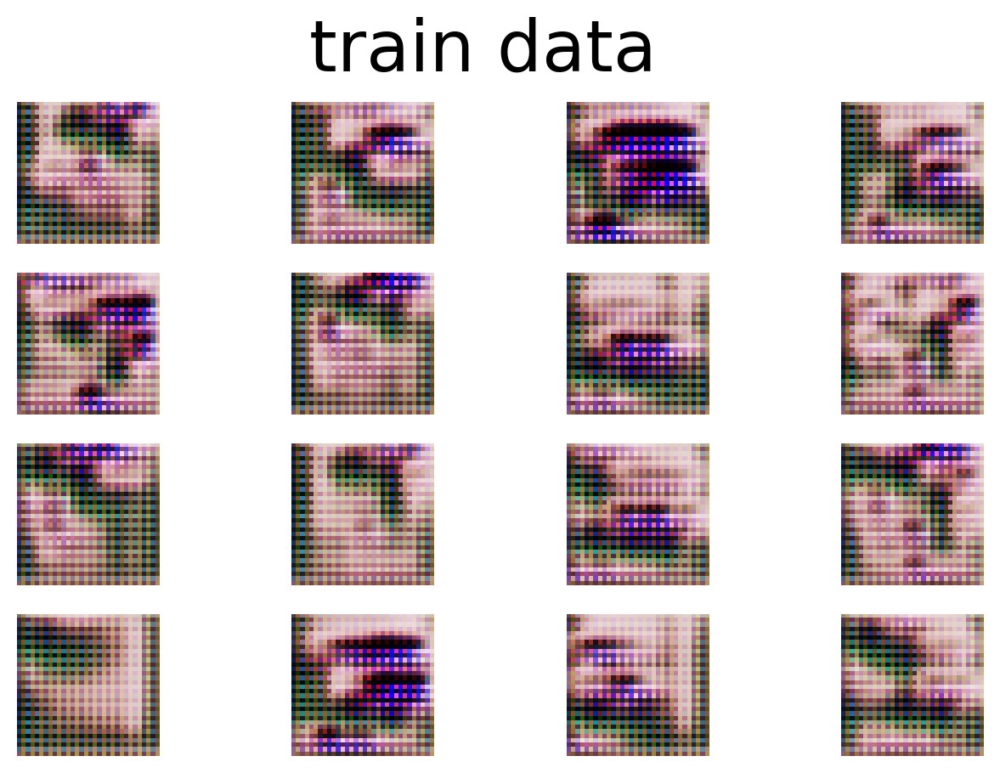

Epoch 11/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 12/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 13/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 14/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 15/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 16/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 17/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 18/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 19/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 20/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch [20/100] | D Loss: 0.3173 | G Loss: 1.9661


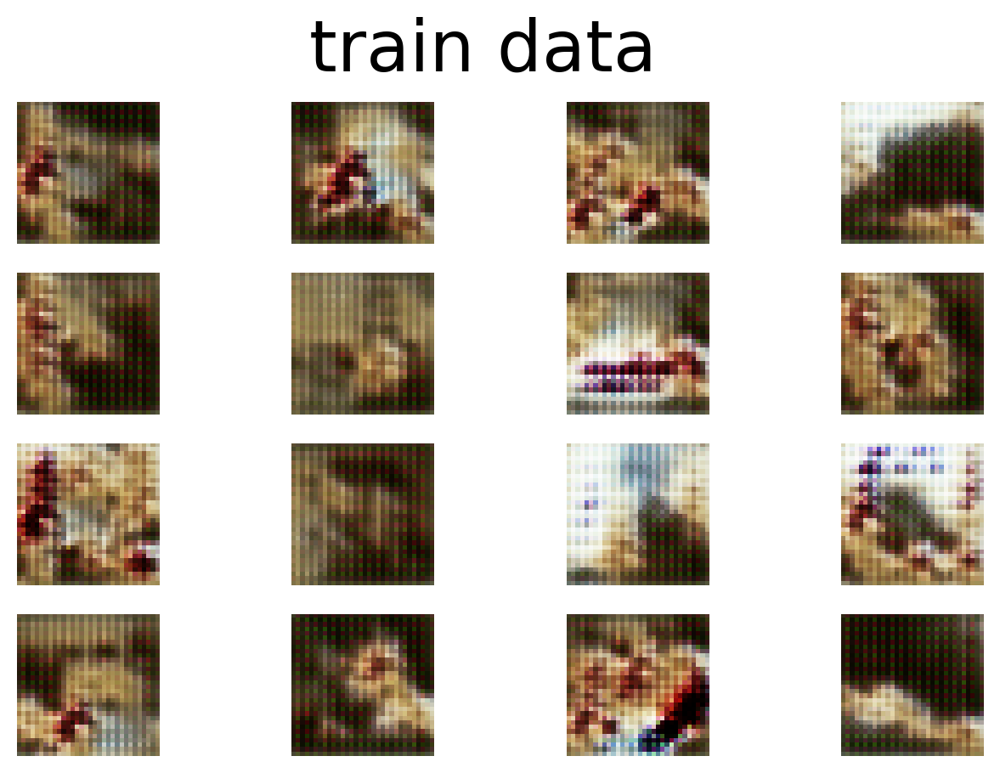

Epoch 21/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 22/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 23/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 24/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 25/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 26/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 27/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 28/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 29/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 30/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch [30/100] | D Loss: 0.3953 | G Loss: 1.6127


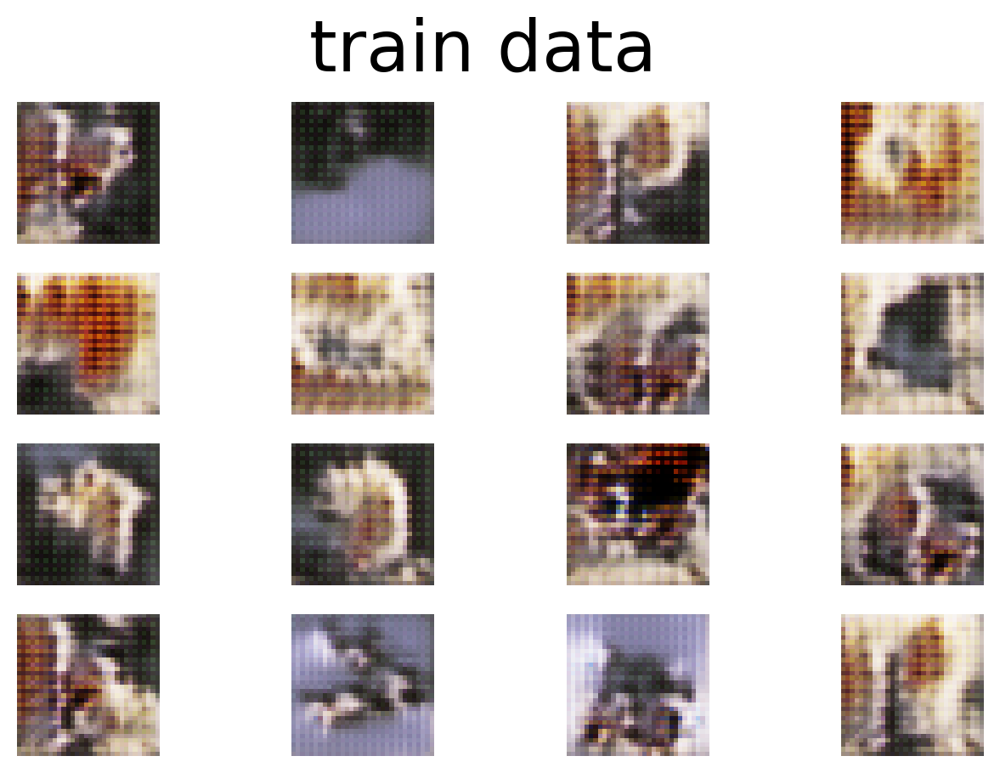

Epoch 31/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 32/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 33/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 34/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 35/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 36/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 37/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 38/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 39/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 40/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch [40/100] | D Loss: 0.5383 | G Loss: 1.1136


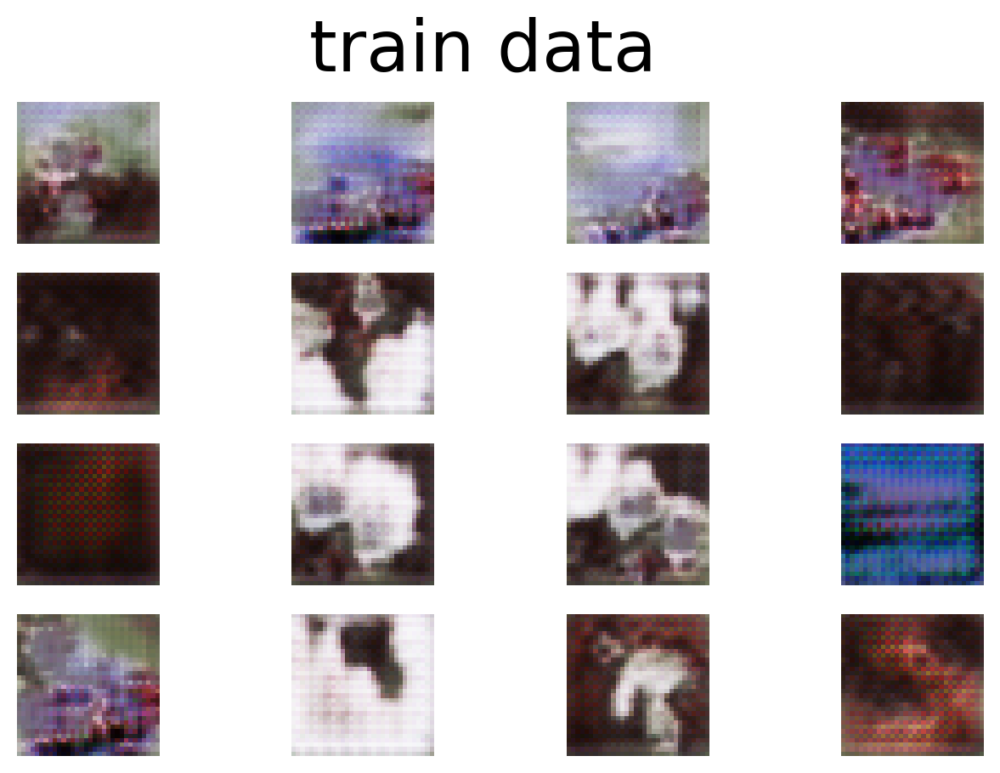

Epoch 41/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 42/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 43/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 44/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 45/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 46/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 47/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 48/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 49/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 50/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch [50/100] | D Loss: 0.6037 | G Loss: 0.9145


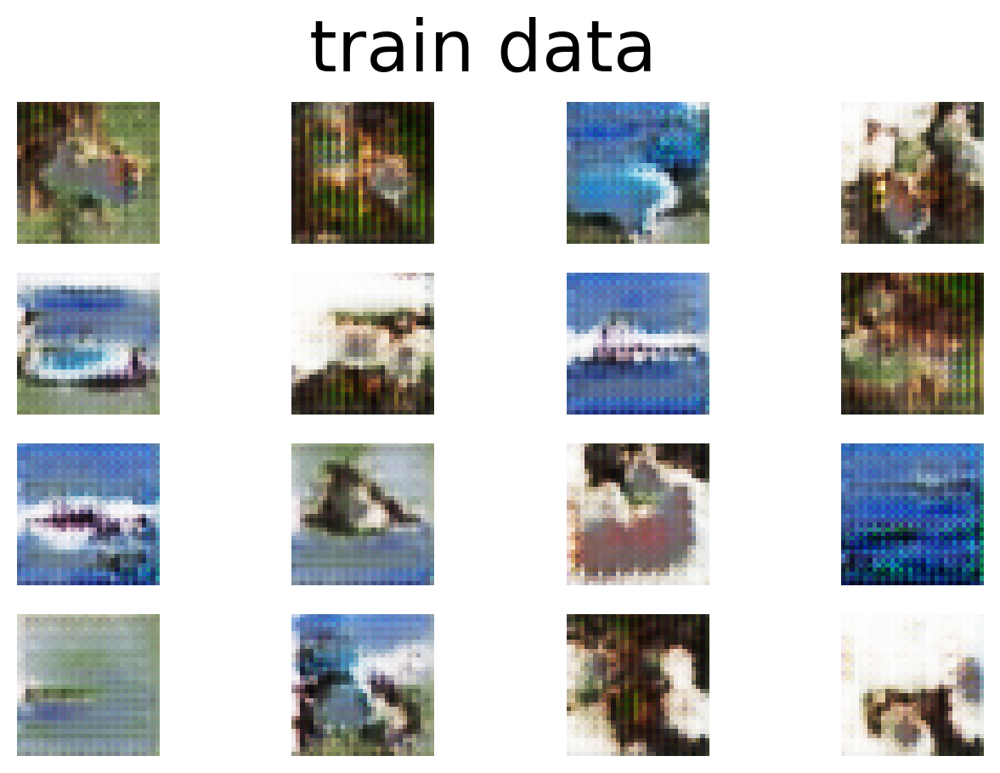

Epoch 51/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 52/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 53/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 54/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 55/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 56/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 57/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 58/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 59/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 60/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch [60/100] | D Loss: 0.5644 | G Loss: 1.0049


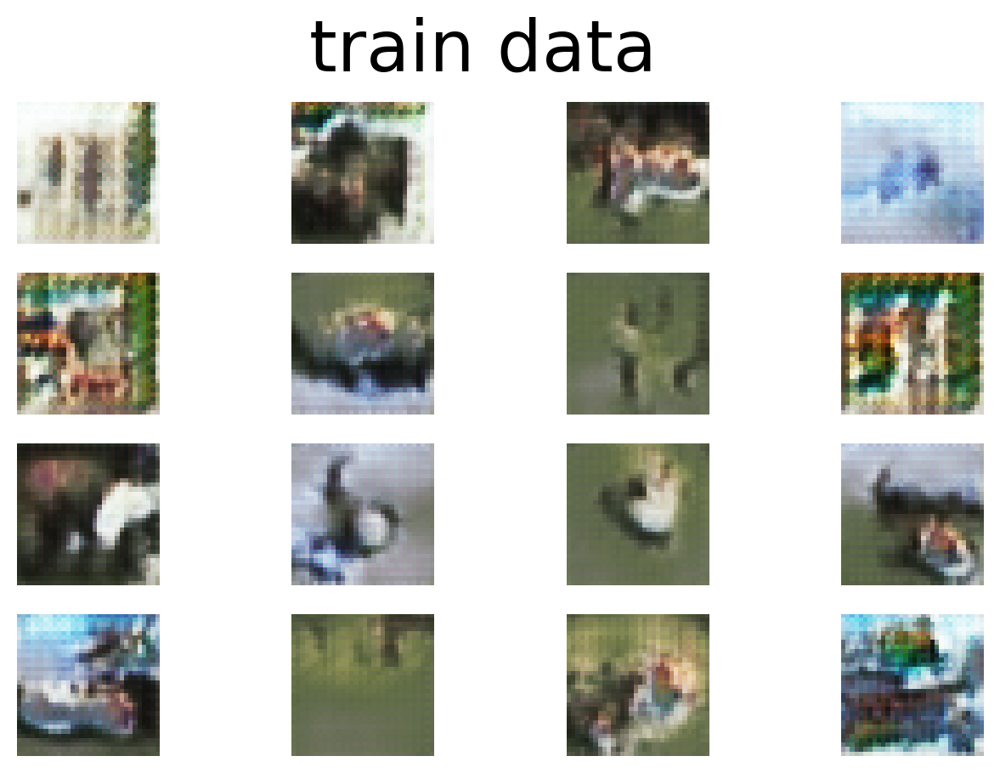

Epoch 61/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 62/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 63/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 64/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 65/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 66/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 67/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 68/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 69/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 70/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch [70/100] | D Loss: 0.5835 | G Loss: 0.9437


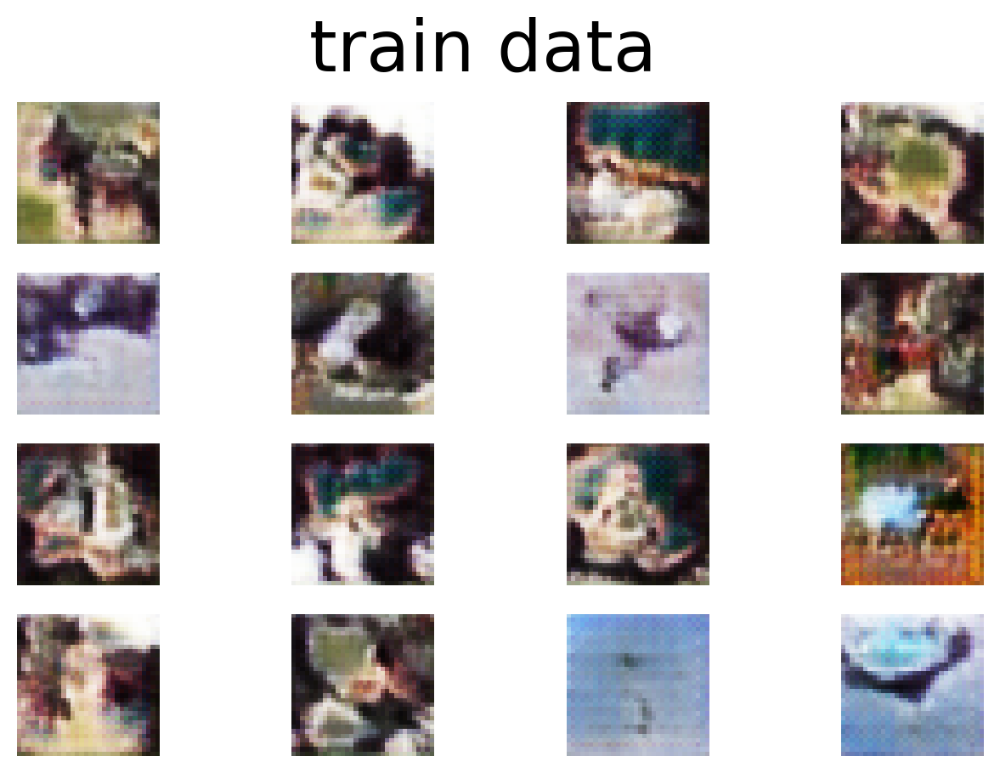

Epoch 71/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 72/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 73/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 74/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 75/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 76/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 77/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 78/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 79/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 80/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch [80/100] | D Loss: 0.6126 | G Loss: 0.9032


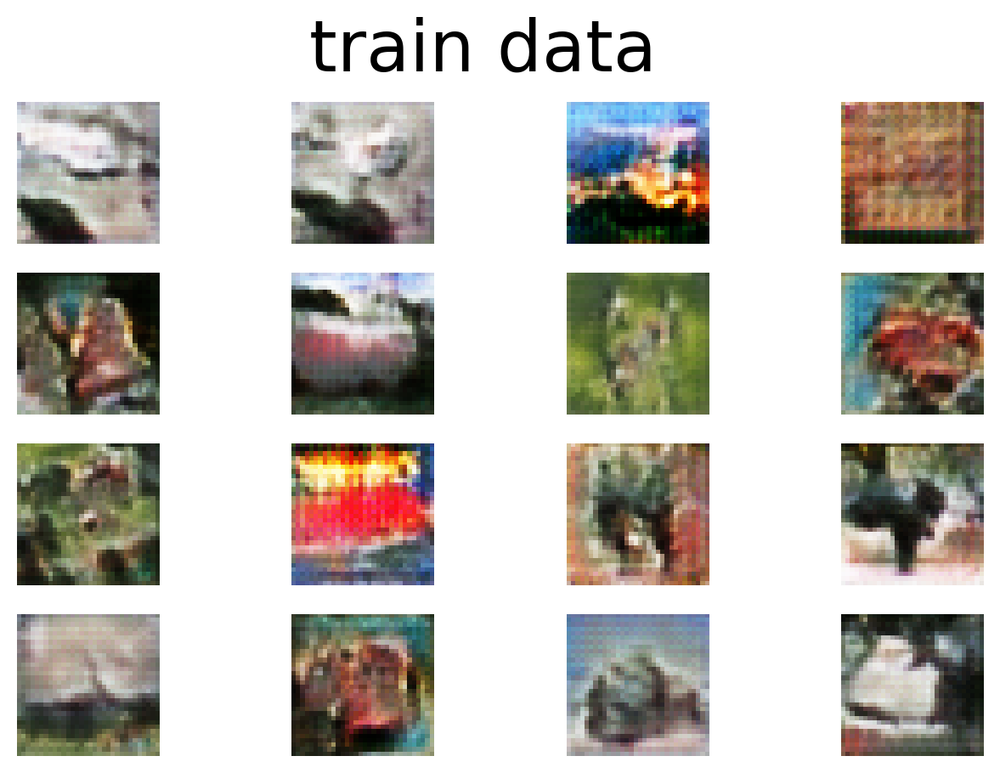

Epoch 81/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 82/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 83/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 84/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 85/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 86/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 87/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 88/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 89/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 90/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch [90/100] | D Loss: 0.5791 | G Loss: 0.9299


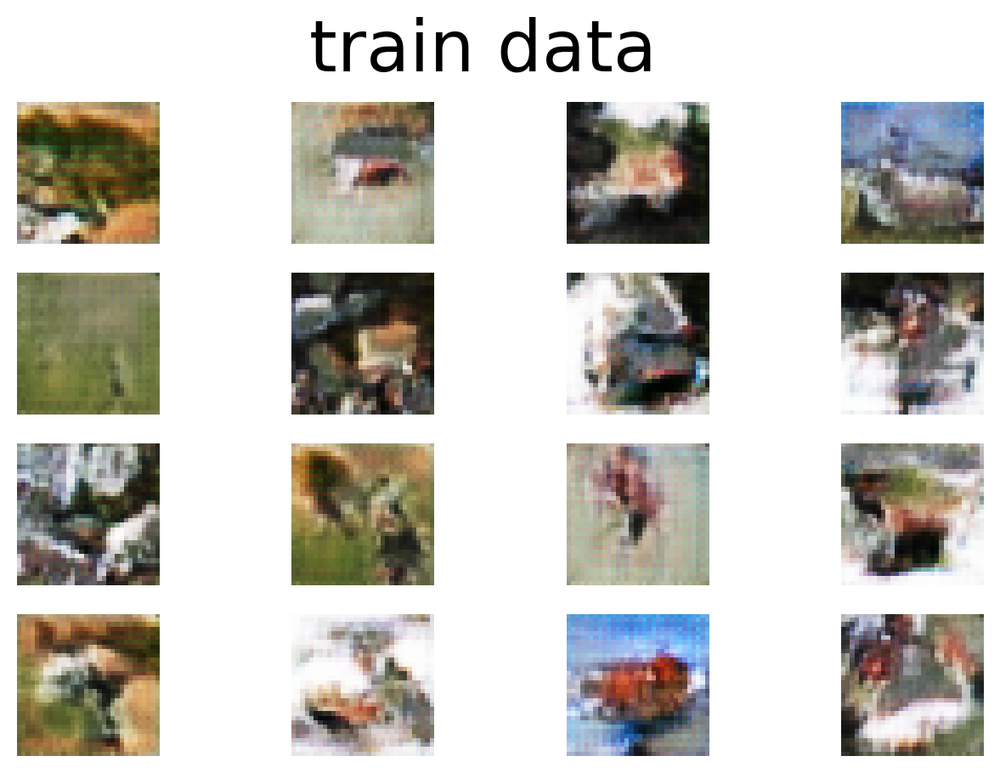

Epoch 91/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 92/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 93/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 94/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 95/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 96/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 97/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 98/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 99/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch 100/100:   0%|          | 0/195 [00:00<?, ?it/s]

Epoch [100/100] | D Loss: 0.5686 | G Loss: 0.9999


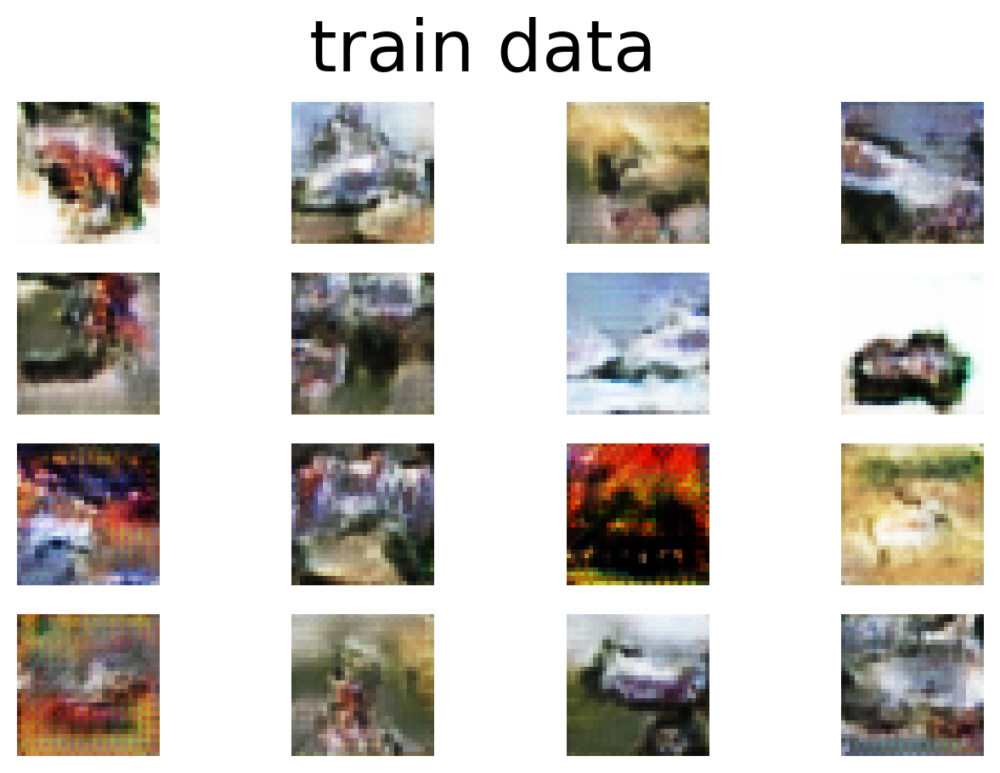

In [73]:
losses = run(num_epochs, generator, discriminator, g_optimizer, d_optimizer, g_scheduler, d_scheduler, criterion, train_loader, z_dim=z_dim)

#### 4. Результаты

В качестве результатов хочется отметить очень сложную настройку гиперпараметров модели в сравнении с простыми u-net like диффузионными моделями.

Так же были проведены эксперементы с несколькими подходами к обучению GAN - [классический](https://arxiv.org/pdf/1406.2661), [WGAN-GP](https://arxiv.org/pdf/1704.00028) и новой [статьей](https://arxiv.org/pdf/2501.05441) 2025 года с доказательством локальной сходимости, однако даже с такими теоретическими гарантиями проблема подбора гиперпараметров к обучению остается актуальной.

## 2. Применение Vision Transformers (ViT):
* Изучите архитектуру Vision Transformer (ViT) и ее отличие от традиционных CNN.
* Используйте предобученную модель ViT или обучите ее с нуля на выбранном вами наборе данных.
* Сравните производительность ViT с аналогичной CNN на той же задаче (например, классификация изображений на CIFAR-10 или ImageNet-subset).
* Оцените модели по метрикам точности и скорости обучения.
* Обсудите преимущества и недостатки использования трансформеров в задачах компьютерного зрения.

#### 1. Модель

В качестве архитектур для сравнения по качеству и скорости обучения будем использовать ResNet-18 и ViT трансформер сопоставимого размера написанные с 0.

Размер сопоставимый с ResNet-18 выбран неслучайно, поскольку позволяет локально обучать модель за приемлемое время.

Обучать модели будем на наборе данных Food101, что позволит сравнить затраты и качество обучения с дообученной ResNet-50 из дз3.

In [2]:
def show_batch(imgs, labels, title="", inv_preprocess=None, map_class=None):
    if type(imgs)  is torch.Tensor:
        if inv_preprocess:
            imgs = inv_preprocess(imgs)
        imgs = imgs.permute(0, 2, 3, 1).numpy()
    nrows = int(len(imgs) ** 0.5)
    ncols = round(len(imgs) / nrows)
    fig = plt.figure(figsize=(12, 8))
    idx = 0
    for i in range(nrows):
        for j in range(ncols):
            ax = fig.add_subplot(nrows, ncols, idx + 1)
            if idx < len(imgs):
                label = labels[idx].item()
                if map_class:
                    label = map_class[label]
                ax.set_title(label)
                plt.imshow((255 * imgs[idx]).astype('uint8'))
                plt.axis('off')
            idx += 1
    plt.suptitle(title, fontsize=30)
    plt.show()

Реализация стандартного ViT трансформера, core архитектуры - энкодерная модель, наиболбший интерес представляет PatchMixer, который разрезает изображение на патчи, добавляет cls токен и обучаемые позиционные смещения.

In [3]:
def to_tuple(size):
    if isinstance(size, tuple):
        return size
    elif isinstance(size, int):
        return (size, size)
    raise ValueError("Wrong size format")


class Attn(nn.Module):
    def __init__(self, dim, heads=8, head_dim=64, dropout=.1):
        super().__init__()
        is_project = not (heads == 1 and dim == head_dim)
        self.heads = heads
        self.inner_dim = heads * head_dim
        self.head_dim = head_dim
        self.qkv = nn.Linear(dim, self.inner_dim * 3)
        self.dropout = nn.Dropout(p=dropout)
        self.scale = head_dim ** -0.5
        self.norm = nn.LayerNorm(dim)
        self.out_proj = nn.Linear(
            self.inner_dim, dim
            ) if is_project else nn.Identity()
    
    def forward(self, x):
        x = self.norm(x)
        qkv = self.qkv(x).chunk(3, dim=-1)
        q, k, v = map(lambda t: rearrange(t, 'b s (n d) -> b n s d', n=self.heads, d=self.head_dim), qkv)
        scores = torch.matmul(q, k.transpose(-1, -2)) * self.scale
        probs = self.dropout(torch.softmax(scores, dim=-1))
        logits = torch.matmul(probs, v)
        logits = rearrange(logits, 'b n s d -> b s (n d)', n=self.heads, d=self.head_dim)
        logits = self.out_proj(logits)
        return logits


class FFN(nn.Module):
    def __init__(self, dim, hidden_dim, dropout=.1):
        super().__init__()
        self.ffn = nn.Sequential(
            nn.LayerNorm(dim),
            nn.Linear(dim, hidden_dim),
            nn.GELU(),
            nn.Dropout(p=dropout),
            nn.Linear(hidden_dim, dim),
            nn.Dropout(p=dropout)
        )
    
    def forward(self, x):
        x = self.ffn(x)
        return x


class Transformer(nn.Module):
    def __init__(self, depth, dim, heads, head_dim, mlp_ratio, dropout=.1):
        super().__init__()
        self.norm = nn.LayerNorm(dim)
        self.layers = nn.ModuleList([])
        for _ in range(depth):
            self.layers.append(nn.ModuleList([
                Attn(dim, heads, head_dim, dropout),
                FFN(dim, int(dim * mlp_ratio))
            ]))
    
    def forward(self, x):
        for attn, ffn in self.layers:
            x = attn(x) + x
            x = ffn(x) + x
        return self.norm(x)


class PatchMixer(nn.Module):
    def __init__(self, size, patch_size, channels, dim, dropout=.1):
        super().__init__()
        width, height = to_tuple(size)
        patch_width, patch_height = to_tuple(patch_size)
        assert width % patch_width == 0
        assert height % patch_height == 0
        num_patches = (width // patch_width) * (height // patch_height)
        patch_dim = channels * patch_width * patch_height
        self.patch_embedings = nn.Sequential(
            Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1=patch_height, p2=patch_width),
            nn.LayerNorm(patch_dim),
            nn.Linear(patch_dim, dim),
            nn.LayerNorm(dim)
        )
        self.cls = nn.Parameter(torch.randn(1, 1, dim))
        self.pos_emb = nn.Parameter(torch.randn(1, num_patches + 1, dim))
        self.dropout = nn.Dropout(dropout)
    
    def forward(self, x):
        x = self.patch_embedings(x)
        b, n, _ = x.size()
        cls_token = repeat(self.cls, '1 1 d -> b 1 d', b=b)
        x = torch.cat((cls_token, x), dim=1)
        x = x + self.pos_emb
        x = self.dropout(x)
        return x

class VIT(nn.Module):
    def __init__(self, size, patch_size, channels,
                 nclass, depth, dim,
                 head_dim, heads, mlp_ratio,
                 dropout, pool='cls'
                 ):
        super().__init__()
        self.patch_mixer = PatchMixer(size, patch_size, channels, dim, dropout)
        self.transformer = Transformer(depth, dim, heads, head_dim, mlp_ratio, dropout)
        self.norm = nn.LayerNorm(dim)
        self.fc = nn.Linear(dim, nclass)
        self.pool = pool
    
    def forward(self, x):
        x = self.patch_mixer(x)
        x = self.transformer(x)
        cls_token = x[:, 0]
        embeddings = x[:, 1:]
        pooled_out = cls_token if self.pool == 'cls' else torch.mean(embeddings, dim=1)
        out = self.fc(pooled_out)
        return out

Цикл обучения из дз3 с ранней остановкой и отслеживанием метрик __acc@1__ и __acc@5__

In [4]:
@torch.no_grad()
def multiclass_score(model, test_loader):
    model.eval()
    acc_1 = []
    acc_5 = []
    all_targets = []
    all_preds = []
    for data, targets in tqdm(test_loader):
        data = data.to(device)
        targets = targets.to(device)
        preds = model(data)
        acc_1.append(topk_acc(preds, targets, 1))
        acc_5.append(topk_acc(preds, targets, 5))
        all_targets.append(targets.cpu())
        all_preds.append(torch.argmax(preds, dim=1).cpu())
    all_targets = torch.cat(all_targets).numpy()
    all_preds = torch.cat(all_preds).numpy()
    print(all_targets.shape, all_preds.shape)
    report = classification_report(all_targets, all_preds, digits=4)
    return report, np.mean(acc_1), np.mean(acc_5)

@torch.no_grad()
def topk_acc(preds, targets, k=3):
    _, topk_idx = torch.topk(preds, k=k, dim=1, largest=True, sorted=True)
    correct = topk_idx.eq(targets.view(-1, 1).expand_as(topk_idx))
    topk_correct = correct[:, :k].sum().item() / targets.size(0)
    return topk_correct

@torch.no_grad()
def val_step(model, criterion, val_loader):
    val_loss = []
    acc_1 = []
    acc_5 = []
    model.eval()
    for data, targets in tqdm(val_loader, desc='Val step: '):
        data = data.to(device)
        targets = targets.to(device)
        preds = model(data)
        loss = criterion(preds, targets)
        val_loss.append(loss.item())
        acc_1.append(topk_acc(preds, targets, 1))
        acc_5.append(topk_acc(preds, targets, 5))
    return np.mean(val_loss), np.mean(acc_1), np.mean(acc_5)

def train_step(model, optimizer, criterion, train_loader, scaler, grad_norm=None):
    model.train()
    train_loss = []
    for data, targets in tqdm(train_loader, desc='Train step: '):
        data = data.to(device)
        targets = targets.to(device)
        with autocast(device_type='cuda', dtype=torch.float16):
            preds = model(data)
            loss = criterion(preds, targets)
        optimizer.zero_grad(set_to_none=True)
        scaler.scale(loss).backward()
        if grad_norm:
            scaler.unscale_(optimizer)
            nn.utils.clip_grad_norm_(model.parameters(), grad_norm)
        scaler.step(optimizer)
        scaler.update()
        train_loss.append(loss.detach().item())
    return np.mean(train_loss)

def run(model, optimizer, criterion, train_loader,
        val_loader, n_epoch=10, validation_step=2,
        scheduler=None, early_stop=10, grad_norm=1.
        ):
    train_loss = []
    val_loss = []
    acc1_loss = []
    acc5_loss = []
    best_weights = None
    best_val_loss = float('-inf')
    patience = 0
    scaler = GradScaler()
    plotlosses = PlotLosses(figsize=(8, 5), step_names='Epoch')
    for idx in range(n_epoch):
        logs = {}
        print("Epoch {}/{}".format(idx, n_epoch))
        train_loss.append(train_step(model, optimizer, criterion, train_loader, scaler, grad_norm))
        logs.update({"loss": train_loss[-1]})
        if (idx + 1) % validation_step == 0:
            loss, acc1, acc5 = val_step(model, criterion, val_loader)
            val_loss.append(loss)
            acc1_loss.append(acc1)
            acc5_loss.append(acc5)
            logs.update({"val loss": loss, "acc@1": acc1, "acc@5": acc5})
            if acc1_loss[-1] > best_val_loss:
                patience = 0
                best_val_loss = acc1_loss[-1]
                best_weights = model.state_dict()
            else:
                patience += 1
            if patience == early_stop:
                model.load_state_dict(best_weights)
                break
        if scheduler:
            scheduler.step()
        plotlosses.update(logs)
        plotlosses.send()
    return train_loss, val_loss, acc1_loss, acc5_loss

#### 2. Датасет

Датасет будем использовать Food101 с обширными аугментациями, поскольку было показано что трансформерные архитектуры намного хуже апроксимируют новые паттерны в данных без агресивных аугментаций.

In [5]:
BATCH_SIZE = 256
IMG_SIZE = 224
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.3, 1.), ratio=(3/4, 4/3)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1),
    transforms.RandomRotation(15),
    transforms.PILToTensor(),
    transforms.ConvertImageDtype(torch.float),
    transforms.RandAugment(num_ops=2, magnitude=6),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
    transforms.RandomErasing(p=0.25, scale=(0.02,0.33), ratio=(0.3,3.3), value='random'),
]) 
test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.PILToTensor(),
    transforms.ConvertImageDtype(torch.float),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])
inv_transform = transforms.Compose([
    transforms.Normalize(mean=[0.,0.,0.], std=[1/0.229, 1/0.224, 1/0.225]),
    transforms.Normalize(mean=[-0.485, -0.456, -0.406], std=[1., 1., 1.]),
])
base_dataset = Food101(root=DATASET_PATH / 'food101', split='train', download=True, transform=train_transform)
test_dataset = Food101(root=DATASET_PATH / 'food101', split='test', download=True, transform=test_transform)
train_dataset, val_dataset = random_split(base_dataset, [int(len(base_dataset) * 0.8), int(len(base_dataset) * 0.2)])
train_loader = DataLoader(train_dataset, BATCH_SIZE, shuffle=True, drop_last=True, num_workers=16, pin_memory=True,  prefetch_factor=2)
val_loader = DataLoader(val_dataset, BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, BATCH_SIZE, num_workers=2, pin_memory=True, shuffle=True)
cls_2_idx = base_dataset.class_to_idx
idx_2_cls = {i:name for name, i in cls_2_idx.items()}

#### 3. Обучение моделей
**Обучение VIT**

После нескольких эксперементов было выявлено, что самый быстрый старт модель получает если ее прогреть несколько эпох, после медленно снижать lr.

Параметры для ViT подобраны таким образом, что бы по размеру быть сопоставимой с ResNet конкурентом. 

In [8]:
lr = 1e-3
num_epochs = 100
warmup_epochs = 10
vit_model = VIT(
    size=IMG_SIZE,
    patch_size=16,
    channels=3,
    nclass=len(cls_2_idx),
    depth=12,
    dim=320,
    head_dim=64,
    heads=5,
    mlp_ratio=4,
    dropout=0.2
).to(device)
model = torch.compile(vit_model)
optimizer = torch.optim.AdamW(vit_model.parameters(), lr=lr, weight_decay=5e-2)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
l_scheduler = torch.optim.lr_scheduler.LinearLR(optimizer, start_factor=0.3, end_factor=1.0, total_iters=warmup_epochs)
cal_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs - warmup_epochs, eta_min=1e-6)
scheduler = torch.optim.lr_scheduler.SequentialLR(optimizer, schedulers=(l_scheduler, cal_scheduler), milestones=[warmup_epochs])
torch.cuda.empty_cache()
import gc;gc.collect()
print(f"Model params: {sum([p.numel() for p in vit_model.parameters()]) / 1e6}M")

Model params: 15.140837M


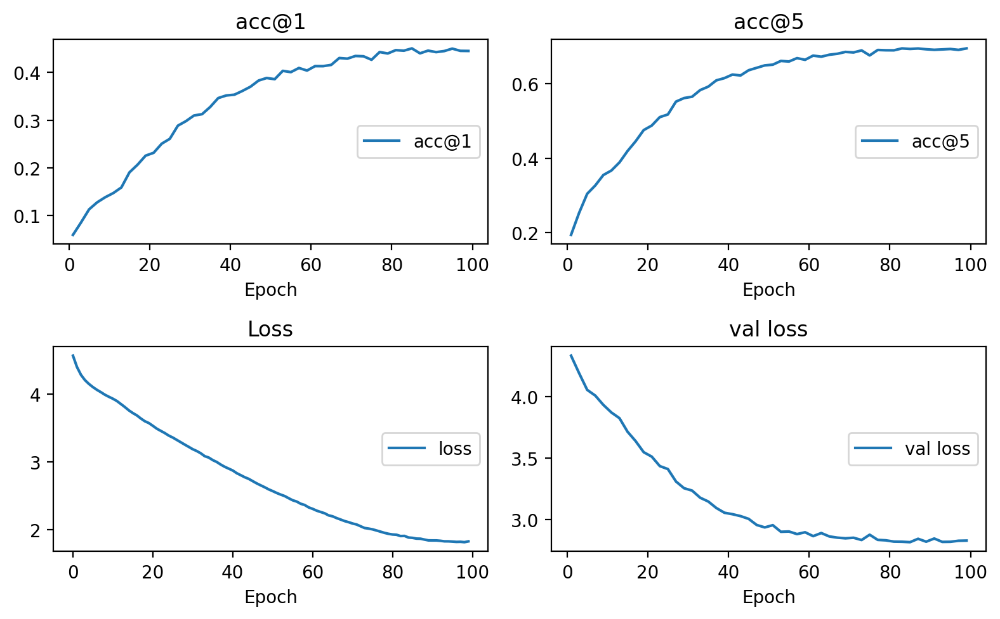

acc@1
	acc@1            	 (min:    0.059, max:    0.451, cur:    0.445)
acc@5
	acc@5            	 (min:    0.194, max:    0.695, cur:    0.695)
Loss
	loss             	 (min:    1.814, max:    4.571, cur:    1.826)
val loss
	val loss         	 (min:    2.813, max:    4.331, cur:    2.826)


In [9]:
resnet_train_loss, resnet_val_loss, resnet_acc1, resnet_acc5 = run(model, optimizer, criterion, train_loader, val_loader, num_epochs, 2, scheduler)

**Метрики**

In [10]:
report, acc1, acc5 = multiclass_score(model, test_loader)
print(report)

  0%|          | 0/99 [00:00<?, ?it/s]

(25250,) (25250,)
              precision    recall  f1-score   support

           0     0.3386    0.2560    0.2916       250
           1     0.6667    0.5280    0.5893       250
           2     0.6091    0.5920    0.6004       250
           3     0.7737    0.7520    0.7627       250
           4     0.4934    0.5960    0.5399       250
           5     0.5981    0.5000    0.5447       250
           6     0.7632    0.6960    0.7280       250
           7     0.7876    0.8160    0.8016       250
           8     0.3299    0.2600    0.2908       250
           9     0.3393    0.2280    0.2727       250
          10     0.5459    0.4040    0.4644       250
          11     0.6617    0.7120    0.6859       250
          12     0.5301    0.5640    0.5465       250
          13     0.5468    0.5840    0.5648       250
          14     0.5338    0.5680    0.5504       250
          15     0.4034    0.3760    0.3892       250
          16     0.3931    0.4120    0.4023       250
         

In [11]:
print(f"Accuracy on test fold - acc@1: {acc1:.4f}, acc@5: {acc5:.4f}")

Accuracy on test fold - acc@1: 0.5659, acc@5: 0.8021


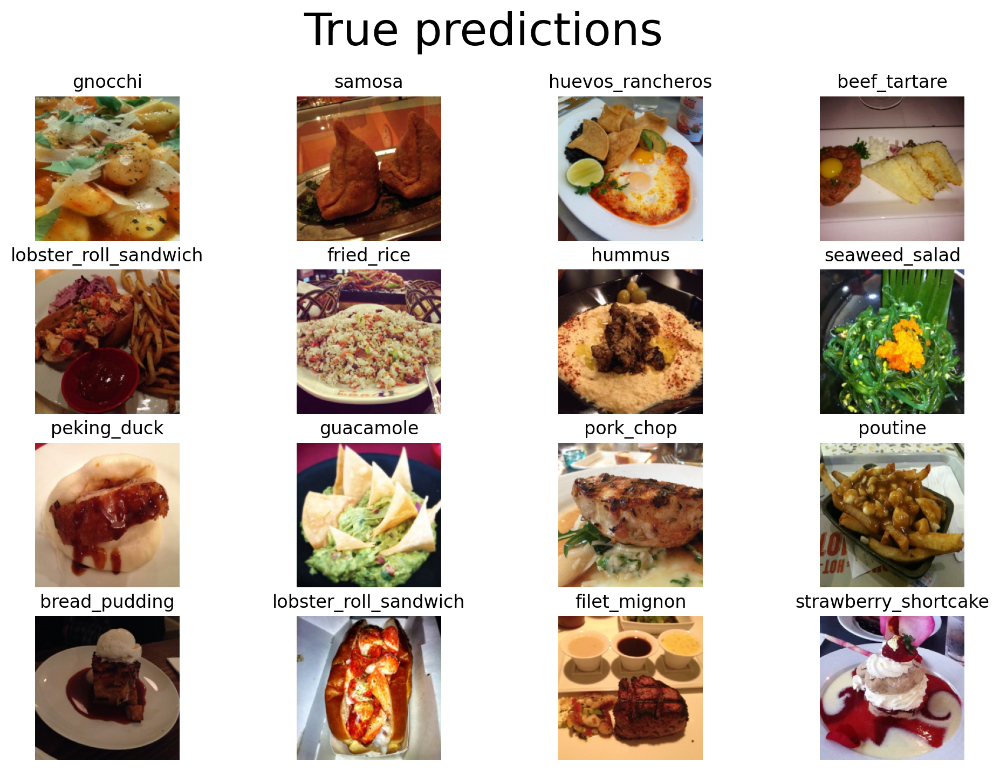

In [12]:
data, targets = next(iter(test_loader))
data = data.to(device)
targets = targets.to(device)
preds = torch.argmax(model(data), dim=1)
mask = (preds == targets)
true_predicts = data[mask].cpu()
true_labels = preds[mask].cpu()
show_batch(true_predicts[:16], true_labels[:16], title="True predictions", inv_preprocess=inv_transform, map_class=idx_2_cls)

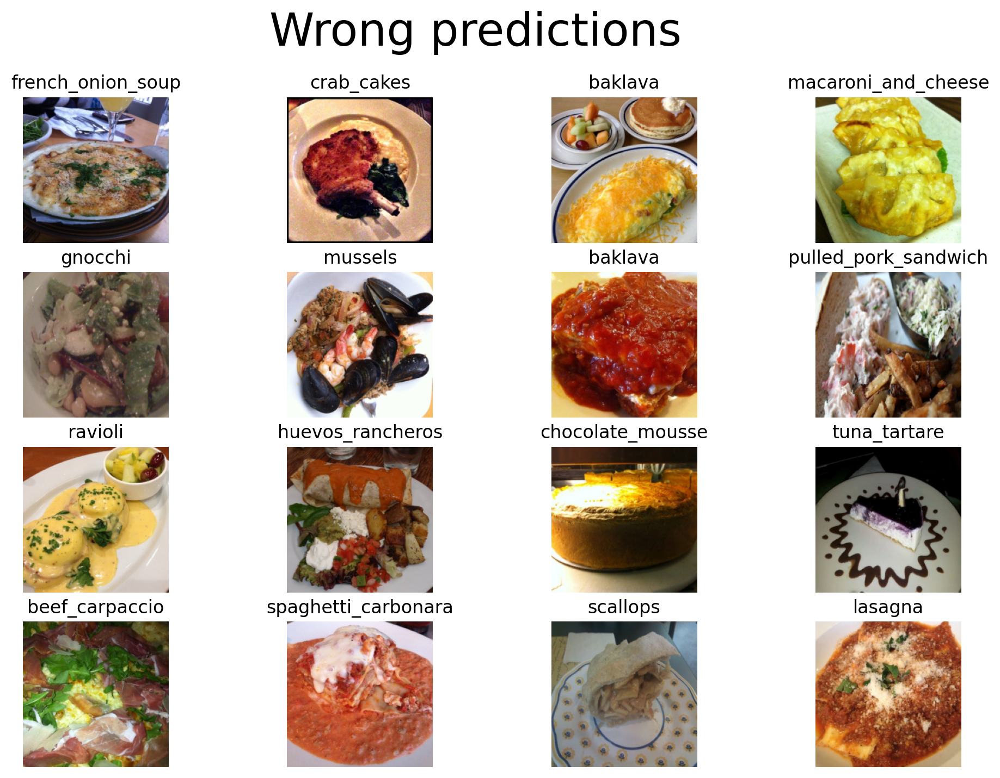

In [13]:
false_predicts = data[~mask].cpu()
false_labels = preds[~mask].cpu()
show_batch(false_predicts[:16], false_labels[:16], title="Wrong predictions", inv_preprocess=inv_transform, map_class=idx_2_cls)

In [14]:
torch.save(vit_model.state_dict(), 'vit.pth')

**Обучение ResNet-18**

Параметры оптимизатора и шедулера оставим что и для ViT

In [713]:
torch.cuda.empty_cache()
import gc;gc.collect()
lr = 1e-3
num_epochs = 50
warmup_epochs = 5
resnet_model = ResNet(ResBlock, [2, 2, 2, 2], num_classes=len(idx_2_cls)).to(device)
model = torch.compile(resnet_model)
optimizer = torch.optim.AdamW(resnet_model.parameters(), lr=lr, weight_decay=5e-2)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
l_scheduler = torch.optim.lr_scheduler.LinearLR(optimizer, start_factor=0.3, end_factor=1.0, total_iters=warmup_epochs)
cal_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs - warmup_epochs, eta_min=1e-6)
scheduler = torch.optim.lr_scheduler.SequentialLR(optimizer, schedulers=(l_scheduler, cal_scheduler), milestones=[warmup_epochs])
print(f"Model params: {sum([p.numel() for p in resnet_model.parameters()]) / 1e6}M")

Model params: 11.228325M


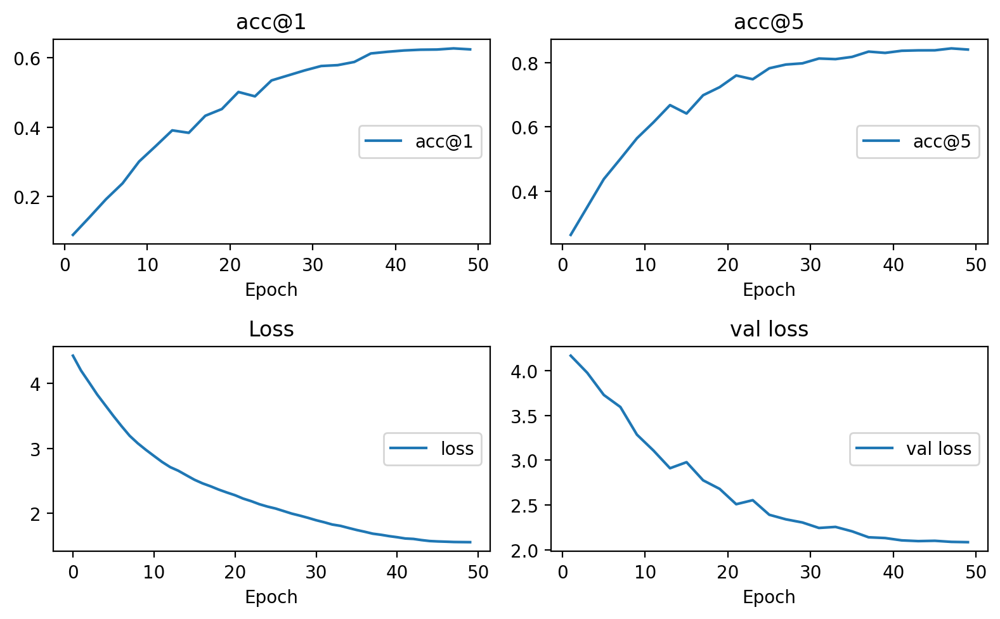

acc@1
	acc@1            	 (min:    0.090, max:    0.626, cur:    0.623)
acc@5
	acc@5            	 (min:    0.266, max:    0.843, cur:    0.840)
Loss
	loss             	 (min:    1.556, max:    4.425, cur:    1.556)
val loss
	val loss         	 (min:    2.086, max:    4.166, cur:    2.086)


In [714]:
resnet_train_loss, resnet_val_loss, resnet_acc1, resnet_acc5 = run(model, optimizer, criterion, train_loader, val_loader, num_epochs, 2, scheduler)

**Метрики**

In [742]:
report, acc1, acc5 = multiclass_score(model, test_loader)
print(report)

  0%|          | 0/99 [00:00<?, ?it/s]

(25250,) (25250,)
              precision    recall  f1-score   support

           0     0.5714    0.5120    0.5401       250
           1     0.8238    0.6360    0.7178       250
           2     0.7595    0.7960    0.7773       250
           3     0.8266    0.8200    0.8233       250
           4     0.6891    0.7360    0.7118       250
           5     0.6016    0.6160    0.6087       250
           6     0.8474    0.8440    0.8457       250
           7     0.8500    0.8840    0.8667       250
           8     0.5714    0.5280    0.5489       250
           9     0.6070    0.5560    0.5804       250
          10     0.7033    0.5880    0.6405       250
          11     0.7638    0.8280    0.7946       250
          12     0.7521    0.7160    0.7336       250
          13     0.6888    0.7880    0.7351       250
          14     0.7026    0.7560    0.7283       250
          15     0.5484    0.6120    0.5784       250
          16     0.6812    0.7520    0.7148       250
         

In [743]:
print(f"Accuracy on test fold - acc@1: {acc1:.4f}, acc@5: {acc5:.4f}")

Accuracy on test fold - acc@1: 0.7370, acc@5: 0.9172


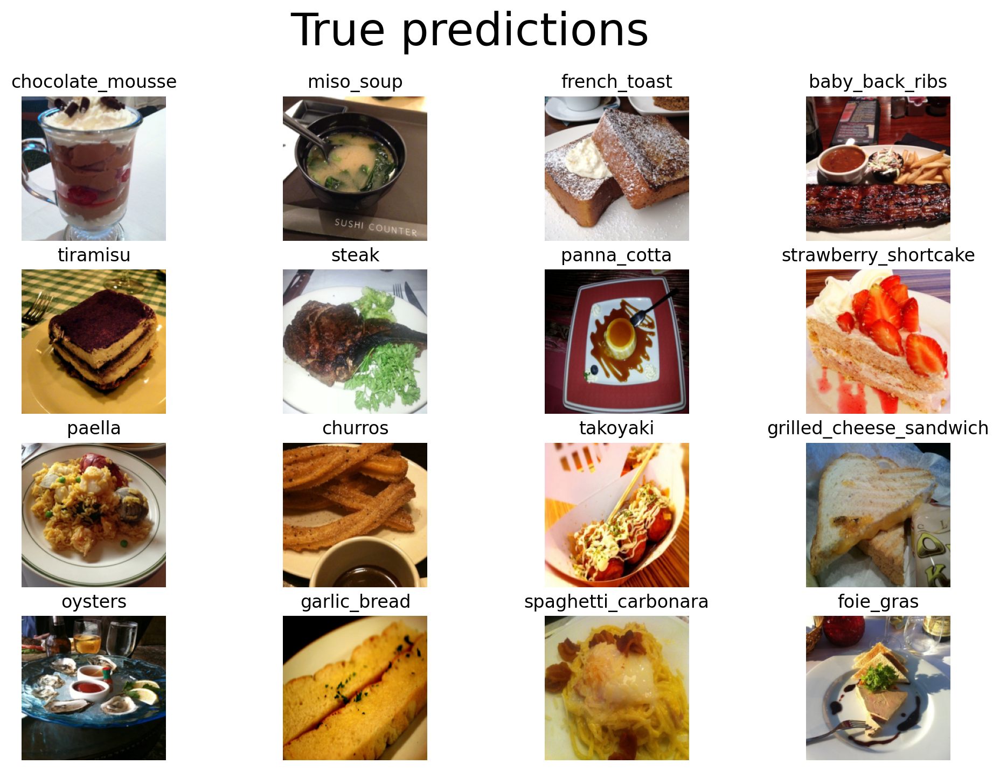

In [744]:
data, targets = next(iter(test_loader))
data = data.to(device)
targets = targets.to(device)
preds = torch.argmax(model(data), dim=1)
mask = (preds == targets)
true_predicts = data[mask].cpu()
true_labels = preds[mask].cpu()
show_batch(true_predicts[:16], true_labels[:16], title="True predictions", inv_preprocess=inv_transform, map_class=idx_2_cls)

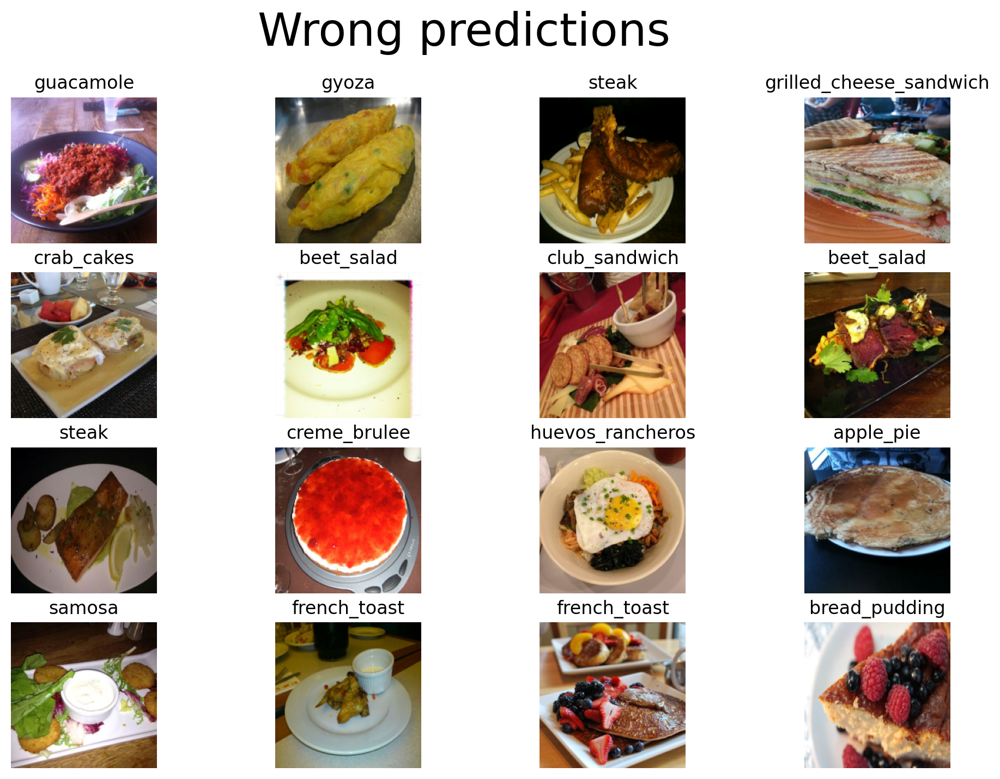

In [745]:
false_predicts = data[~mask].cpu()
false_labels = preds[~mask].cpu()
show_batch(false_predicts[:16], false_labels[:16], title="Wrong predictions", inv_preprocess=inv_transform, map_class=idx_2_cls)

In [755]:
torch.save(resnet_model.state_dict(), 'resnet-18.pth')

#### 4. Результаты

По метрикам и графикам обучения видно, что CNN сети с приблизительно равным числом параметров в разы превосходят в скорости обучения стандартный ViT.

Эмпирически получилось что не смотря на вдвое большее время обучения трансформер не смог догнать CNN. 

А вот CNN показала неожиданно хорошие результаты, при вдвое меньшем числе параметров чем в ResNet-50 из дз-3, при этом потребляя на обучение ~ в 1.5 раза больше времени 50 минут vs 30 минут и качество метрик __acc@1__ - 0.7370 vs 0.7471; __acc@5__ 0.9172 vs  0.9177. Однако стоит заметить что такое сравнение не вполне корректно, поскольку для дообучения ResNet-50 использовалось 20% исходных данных.

Такие различия в скорости обучения и качестве можно объяснить тем что архитектура CNN по построению предполагает улавливание границ объектов и локальных паттернов изображения с последующим иерархичиским объединением и усложнением с продвижением в глубь, в то время как трансформерная архитектура вроде ViT не обладает никакими изначальными предположениями о том что такое изображении и должнf выявлять наиболее важные паттерны только в ходе самого обучения "без подсказок", через рекомбинацию признаков. 

Однако как было показано во многих статьях на практике при large-scale обучении трансформерные архитектуры перебивают индуктывный bias CNN. И способны улавливать более тонкие и сложные зависимости в данных помимо чисто структурных, при условии достаточного объема данных.